In [3]:
# Import Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Load in csv files

df_batting = pd.read_csv('data/batting_stats.csv')
df_pitching = pd.read_csv('data/pitching_stats.csv')
df_fielding = pd.read_csv('data/fielding_stats.csv')
df_playoff = pd.read_csv('data/playoff_cleaned.csv')

<hr style="border:2px solid gray"> </hr>

# <u>Data Preparation and Simple EDA</u>

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In this workbook, I performed some analysis on data from the distribution of the data to see if I needed to transform data so they are more normally distirbuted. Then I merged four csv files I created earlier in data collection workbook to putting them in machine learning ready shape. I standardized and scaled data so they are easy to interpret. Lastly, I removed strongly correlated statistics to avoid strong presence of multicollinearity

In [5]:
# Preview of df_batting

df_batting.head(10)

,team,batters_used,batter_age,games,b_runs,b_hits,doubles,triples,homeruns,rbi,...,b_strikeouts,batting_average,on_base_percentage,slugging,ops,ops_plus,total_bases,ground_double_play,b_left_on_base,year
0,ATL,39,29.0,162,691,1411,195,22,141,640,...,665,0.258,0.321,0.380,0.700,95,2073,130,1107,1969.0
1,BAL,30,28.1,162,779,1465,234,29,175,722,...,806,0.265,0.343,0.414,0.756,110,2282,138,1200,1969.0
2,BOS,40,26.1,162,743,1381,234,37,197,701,...,923,0.251,0.333,0.415,0.748,104,2280,125,1164,1969.0
3,CAL,45,26.1,163,528,1221,151,29,88,480,...,929,0.230,0.300,0.319,0.618,78,1694,105,1115,1969.0
4,CHC,41,29.2,163,720,1400,215,40,142,671,...,928,0.253,0.323,0.384,0.707,88,2121,111,1186,1969.0
5,CHW,43,27.2,162,625,1346,210,27,112,585,...,844,0.247,0.320,0.357,0.677,85,1946,119,1189,1969.0
6,CIN,36,26.3,163,798,1558,224,42,171,750,...,1042,0.277,0.335,0.422,0.757,107,2379,117,1134,1969.0
7,CLE,40,27.3,161,573,1272,173,24,119,534,...,906,0.237,0.307,0.345,0.652,80,1850,147,1077,1969.0
8,DET,34,28.9,162,701,1316,188,29,182,649,...,922,0.242,0.316,0.387,0.703,92,2108,113,1118,1969.0
9,HOU,37,26.5,162,676,1284,208,40,104,618,...,972,0.240,0.330,0.352,0.683,93,1884,109,1212,1969.0


In [6]:
# Make sure things are in right Dtype. I have everything I need in numeric
df_batting.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1438 entries, 0 to 1437
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   team                1438 non-null   object 
 1   batters_used        1438 non-null   int64  
 2   batter_age          1438 non-null   float64
 3   games               1438 non-null   int64  
 4   b_runs              1438 non-null   int64  
 5   b_hits              1438 non-null   int64  
 6   doubles             1438 non-null   int64  
 7   triples             1438 non-null   int64  
 8   homeruns            1438 non-null   int64  
 9   rbi                 1438 non-null   int64  
 10  sb                  1438 non-null   int64  
 11  cs                  1438 non-null   int64  
 12  walks               1438 non-null   int64  
 13  b_strikeouts        1438 non-null   int64  
 14  batting_average     1438 non-null   float64
 15  on_base_percentage  1438 non-null   float64
 16  sluggi

In [7]:
from IPython.display import Image

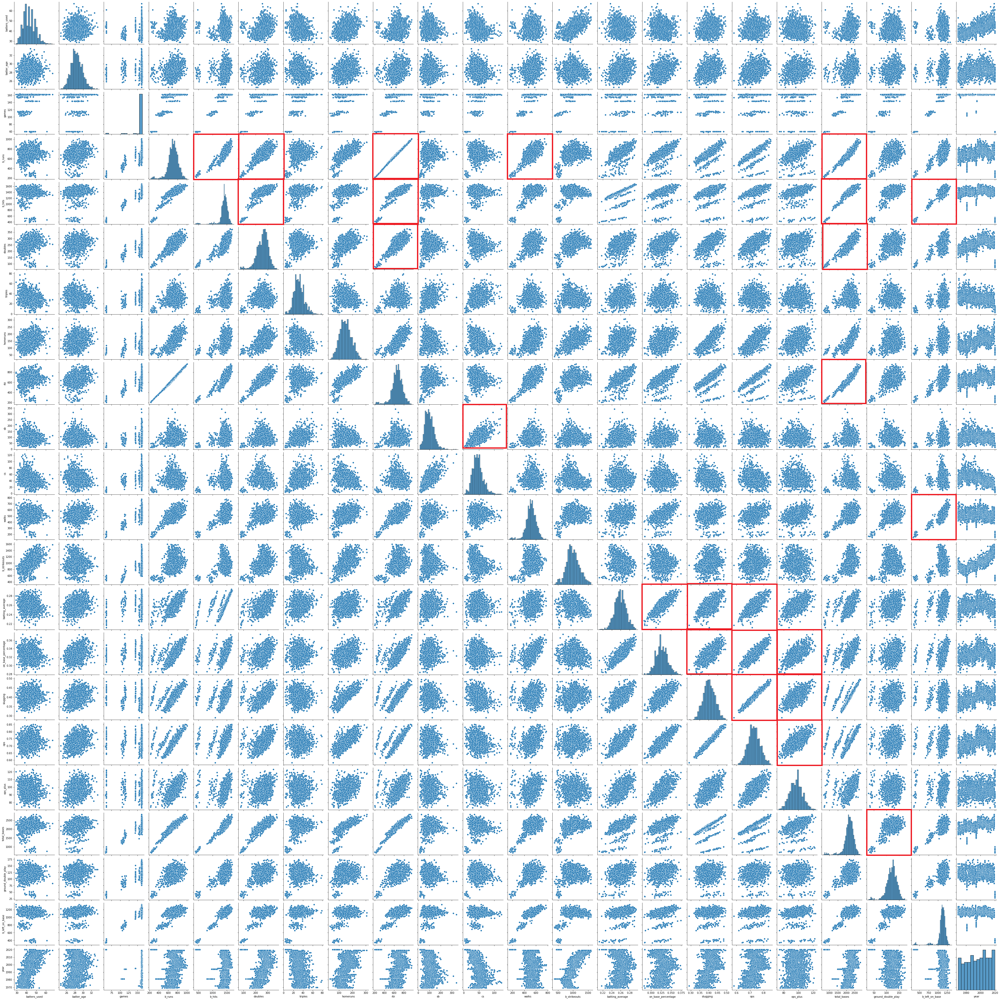

In [8]:
# This is screenshot of pairplot of df_batting to investigate the distribution and correlation between two features
Image(filename = 'data/pairplot_batting.png')

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;This is pairplot of `df_batting` on seaborn. I plotted to investigate further on distribution of my data. Hitting features look normally distributed so there does not seem to be any data transformation required.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Ones with red boundaries look strong correlation between two features. With strong correlation, it would violate no multicollinearity assumptions in logistic regression model I plan on using. Hence will investigate further and act on it appropriately.

<div class="alert alert-block alert-info">

<b>NOTE</b> 

I went through modelling process with every features in it first. Then I went through the same process with strong multicollinearity gone and the results were not very different. Hence, I ultimately decided to feed the models with less features in data
</div>

In [9]:
# Taking a look at df_pitching as well
df_pitching.head(10)

,team,pitchers_used,pitcher_age,era,innings_pitched,p_hits,p_runs,earned_runs,homeruns_allowed,walks_allowed,...,hbp,era_plus,whip,hits_per_nine,hr_per_nine,walks_per_nine,so_per_nine,so_walk,p_left_on_base,year
0,ATL,18,27.5,3.53,1445.0,1334,631,566,144,438,...,27,103,1.226,8.3,0.9,2.7,5.6,2.04,1076,1969.0
1,BAL,14,27.7,2.83,1473.2,1194,517,463,117,498,...,22,126,1.148,7.3,0.7,3.0,5.5,1.80,1033,1969.0
2,BOS,19,26.5,3.92,1466.2,1423,736,639,155,685,...,48,98,1.437,8.7,1.0,4.2,5.7,1.37,1257,1969.0
3,CAL,19,26.6,3.54,1438.1,1294,652,566,126,517,...,51,98,1.259,8.1,0.8,3.2,5.5,1.71,1032,1969.0
4,CHC,17,27.6,3.34,1454.1,1366,611,540,118,475,...,29,121,1.266,8.5,0.7,2.9,6.3,2.14,1129,1969.0
5,CHW,20,28.4,4.21,1437.2,1470,723,672,146,564,...,33,93,1.415,9.2,0.9,3.5,5.1,1.44,1168,1969.0
6,CIN,17,27.3,4.11,1465.0,1478,768,669,149,611,...,56,91,1.426,9.1,0.9,3.8,5.0,1.34,1270,1969.0
7,CLE,16,27.3,3.94,1437.0,1330,717,629,134,681,...,48,95,1.399,8.3,0.8,4.3,6.3,1.47,1198,1969.0
8,DET,16,28.1,3.31,1455.1,1250,601,536,128,586,...,34,113,1.262,7.7,0.8,3.6,6.4,1.76,1138,1969.0
9,HOU,18,25.6,3.60,1435.2,1347,668,574,111,547,...,35,99,1.319,8.4,0.7,3.4,7.7,2.23,1151,1969.0


In [10]:
# Again check for Dtype. Looks good!
df_pitching.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1438 entries, 0 to 1437
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   team              1438 non-null   object 
 1   pitchers_used     1438 non-null   int64  
 2   pitcher_age       1438 non-null   float64
 3   era               1438 non-null   float64
 4   innings_pitched   1438 non-null   float64
 5   p_hits            1438 non-null   int64  
 6   p_runs            1438 non-null   int64  
 7   earned_runs       1438 non-null   int64  
 8   homeruns_allowed  1438 non-null   int64  
 9   walks_allowed     1438 non-null   int64  
 10  p_strikeouts      1438 non-null   int64  
 11  saves             1438 non-null   int64  
 12  hbp               1438 non-null   int64  
 13  era_plus          1438 non-null   int64  
 14  whip              1438 non-null   float64
 15  hits_per_nine     1438 non-null   float64
 16  hr_per_nine       1438 non-null   float64


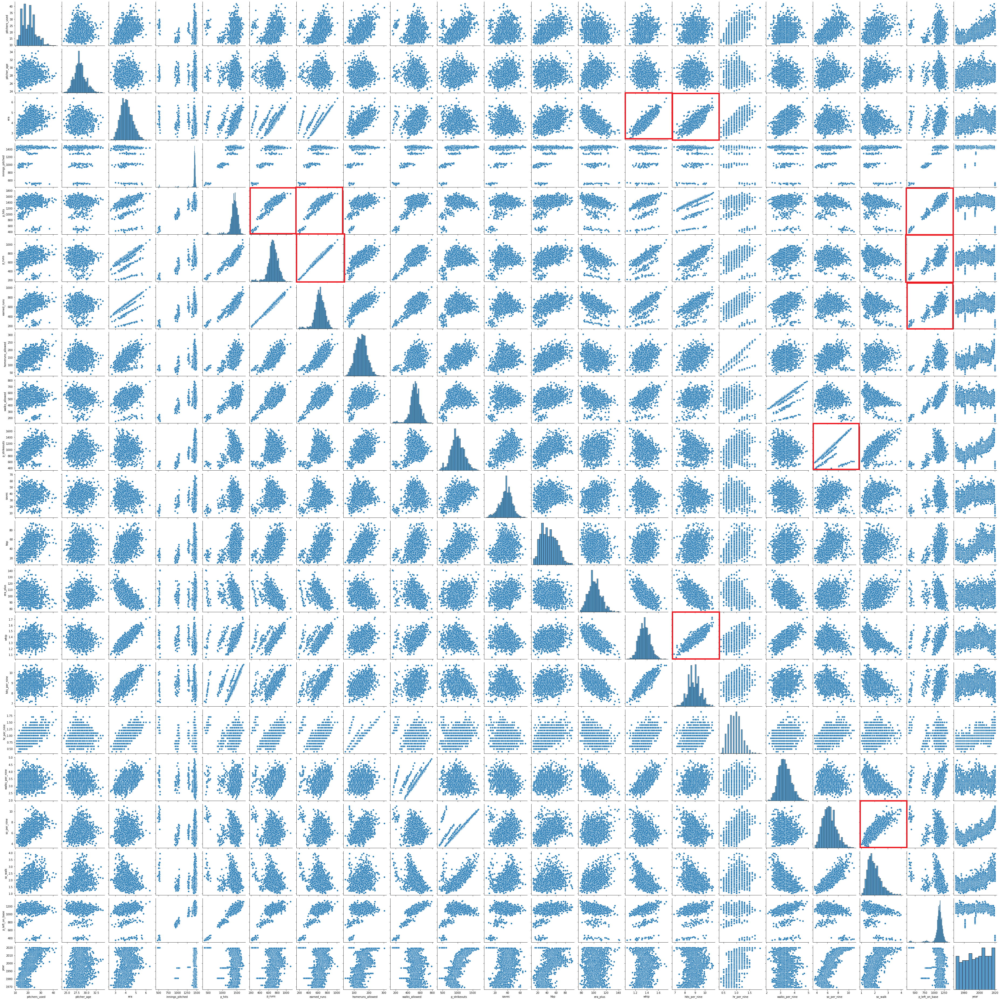

In [11]:
Image(filename = 'data/pairplot_pitching.png')

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Just like the pairplot of `batting_df`, I can see obvious correlation on some of the features in `pitching_df`. The distribution of the features in `pitching_df` seem normally distributed as well so no further transformation look required. I will investigate further in later section to address the clear correlations in these two dataframes.

In [12]:
# Lastly, df_fielding.
df_fielding.head(10)

,team,fielders_used,defensive_efficiency,errors,fielding_percentage,Rtot,year
0,ATL,39,0.721,115,0.981,50,1969
1,BAL,30,0.743,101,0.984,114,1969
2,BOS,40,0.700,157,0.975,-2,1969
3,CAL,45,0.716,136,0.978,25,1969
4,CHC,39,0.700,136,0.979,-11,1969
5,CHW,43,0.698,122,0.981,-18,1969
6,CIN,33,0.700,168,0.973,-14,1969
7,CLE,40,0.704,145,0.976,-46,1969
8,DET,33,0.721,130,0.979,32,1969
9,HOU,36,0.683,153,0.975,-72,1969


In [13]:
# Check for Dtype again. Looks good!
df_fielding.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1438 entries, 0 to 1437
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   team                  1438 non-null   object 
 1   fielders_used         1438 non-null   int64  
 2   defensive_efficiency  1438 non-null   float64
 3   errors                1438 non-null   int64  
 4   fielding_percentage   1438 non-null   float64
 5   Rtot                  1438 non-null   int64  
 6   year                  1438 non-null   int64  
dtypes: float64(2), int64(4), object(1)
memory usage: 78.8+ KB


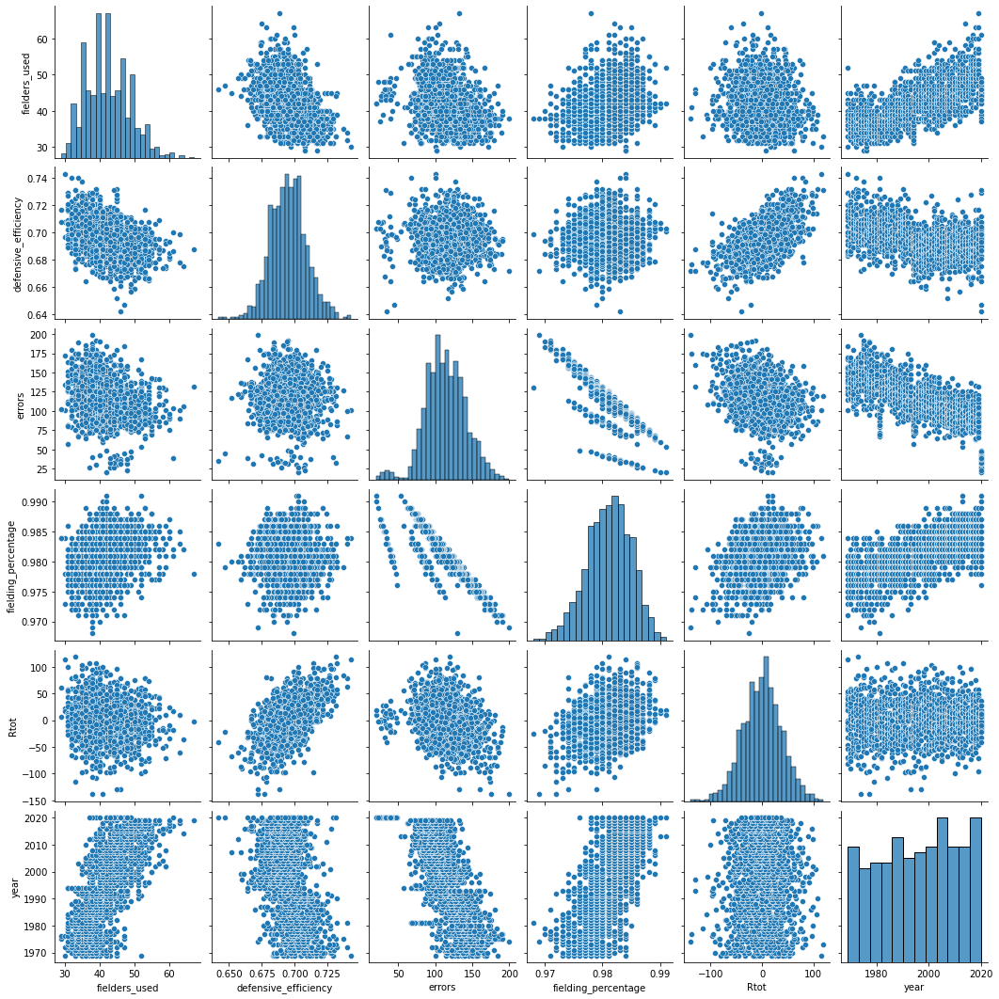

In [14]:
sns.pairplot(df_fielding)

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Unlike the first two data frame, `fielding_df` looks good except for the negative correlation between `erros` and `fielding_percentage`. Again, distribution of features look normal!

In [15]:
# Make sure batting, pitching and fielding have same team names

# This step is required so I can merge these three dataframes into one dataframe for machine learning models

df_batting['team'].tolist() == df_pitching['team'].tolist() == df_fielding['team'].tolist()

True

In [16]:
# This looks a little different as it comes from Wikipedia
df_playoff

,Unnamed: 0,Postseason Appearances
0,ARI,"1999, 2001, 2002, 2007, 2011, 2017"
1,ATL,"1969, 1982, 1991, 1992, 1993, 1995, 1996, 1997..."
2,BAL,"1966, 1969, 1970, 1971, 1973, 1974, 1979, 1983..."
3,BOS,"1903, 1912, 1915, 1916, 1918, 1946, 1967, 1975..."
4,CHC,"1906, 1907, 1908, 1910, 1918, 1929, 1932, 1935..."
5,CWS,"1906, 1917, 1919, 1959, 1983, 1993, 2000, 2005..."
6,CIN,"1919, 1939, 1940, 1961, 1970, 1972, 1973, 1975..."
7,CLE,"1920, 1948, 1954, 1995, 1996, 1997, 1998, 1999..."
8,COL,"1995, 2007, 2009, 2017, 2018"
9,DET,"1907, 1908, 1909, 1934, 1935, 1940, 1945, 1968..."


In [17]:
# Bit of clean up. Use the first column as index
df_playoff.rename(index = df_playoff['Unnamed: 0'], inplace = True)

In [18]:
# Drop what's left off
df_playoff.drop(columns = 'Unnamed: 0', inplace = True)

In [19]:
# Double check
df_playoff

,Postseason Appearances
ARI,"1999, 2001, 2002, 2007, 2011, 2017"
ATL,"1969, 1982, 1991, 1992, 1993, 1995, 1996, 1997..."
BAL,"1966, 1969, 1970, 1971, 1973, 1974, 1979, 1983..."
BOS,"1903, 1912, 1915, 1916, 1918, 1946, 1967, 1975..."
CHC,"1906, 1907, 1908, 1910, 1918, 1929, 1932, 1935..."
CWS,"1906, 1917, 1919, 1959, 1983, 1993, 2000, 2005..."
CIN,"1919, 1939, 1940, 1961, 1970, 1972, 1973, 1975..."
CLE,"1920, 1948, 1954, 1995, 1996, 1997, 1998, 1999..."
COL,"1995, 2007, 2009, 2017, 2018"
DET,"1907, 1908, 1909, 1934, 1935, 1940, 1945, 1968..."


## Merging DataFrames

First I want to look at the shapes of three statistics data frames to ensure I can merge them

In [20]:
df_batting.shape

(1438, 23)

In [21]:
df_pitching.shape

(1438, 22)

In [22]:
df_fielding.shape

(1438, 7)

In [23]:
# First merge df_batting and df_pitching
df = df_batting.merge(df_pitching, on = ['year', 'team'])

# 23 (# of batting features) + 22 (# of pitching features) - 2 (`year` and `team`) = 43 features

In [24]:
# Double Check!
df

,team,batters_used,batter_age,games,b_runs,b_hits,doubles,triples,homeruns,rbi,...,saves,hbp,era_plus,whip,hits_per_nine,hr_per_nine,walks_per_nine,so_per_nine,so_walk,p_left_on_base
0,ATL,39,29.0,162,691,1411,195,22,141,640,...,42,27,103,1.226,8.3,0.9,2.7,5.6,2.04,1076
1,BAL,30,28.1,162,779,1465,234,29,175,722,...,36,22,126,1.148,7.3,0.7,3.0,5.5,1.80,1033
2,BOS,40,26.1,162,743,1381,234,37,197,701,...,41,48,98,1.437,8.7,1.0,4.2,5.7,1.37,1257
3,CAL,45,26.1,163,528,1221,151,29,88,480,...,39,51,98,1.259,8.1,0.8,3.2,5.5,1.71,1032
4,CHC,41,29.2,163,720,1400,215,40,142,671,...,27,29,121,1.266,8.5,0.7,2.9,6.3,2.14,1129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1433,STL,44,28.8,58,240,410,73,7,51,231,...,13,26,112,1.226,7.2,1.3,3.9,8.8,2.27,341
1434,TBR,44,27.1,60,289,470,105,12,80,274,...,23,29,120,1.219,8.1,1.2,2.9,9.4,3.29,400
1435,TEX,49,27.4,60,224,420,80,9,62,204,...,10,30,91,1.384,8.3,1.4,4.1,8.5,2.07,411
1436,TOR,49,25.9,60,302,516,104,4,88,288,...,17,14,96,1.462,8.9,1.4,4.3,8.9,2.08,423


In [25]:
# And merge df_fielding to df
df = df.merge(df_fielding, on = ['year', 'team'])

# 43 (from earlier) + 5 (# of fielding features added) = 48 features

In [26]:
df

,team,batters_used,batter_age,games,b_runs,b_hits,doubles,triples,homeruns,rbi,...,hr_per_nine,walks_per_nine,so_per_nine,so_walk,p_left_on_base,fielders_used,defensive_efficiency,errors,fielding_percentage,Rtot
0,ATL,39,29.0,162,691,1411,195,22,141,640,...,0.9,2.7,5.6,2.04,1076,39,0.721,115,0.981,50
1,BAL,30,28.1,162,779,1465,234,29,175,722,...,0.7,3.0,5.5,1.80,1033,30,0.743,101,0.984,114
2,BOS,40,26.1,162,743,1381,234,37,197,701,...,1.0,4.2,5.7,1.37,1257,40,0.700,157,0.975,-2
3,CAL,45,26.1,163,528,1221,151,29,88,480,...,0.8,3.2,5.5,1.71,1032,45,0.716,136,0.978,25
4,CHC,41,29.2,163,720,1400,215,40,142,671,...,0.7,2.9,6.3,2.14,1129,39,0.700,136,0.979,-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1433,STL,44,28.8,58,240,410,73,7,51,231,...,1.3,3.9,8.8,2.27,341,44,0.731,33,0.983,28
1434,TBR,44,27.1,60,289,470,105,12,80,274,...,1.2,2.9,9.4,3.29,400,43,0.693,33,0.985,13
1435,TEX,49,27.4,60,224,420,80,9,62,204,...,1.4,4.1,8.5,2.07,411,49,0.704,40,0.981,12
1436,TOR,49,25.9,60,302,516,104,4,88,288,...,1.4,4.3,8.9,2.08,423,48,0.681,38,0.982,-9


In [27]:
# Make sure there is no na values in my merged dataframe
df.isna().sum()

team                    0
batters_used            0
batter_age              0
games                   0
b_runs                  0
b_hits                  0
doubles                 0
triples                 0
homeruns                0
rbi                     0
sb                      0
cs                      0
walks                   0
b_strikeouts            0
batting_average         0
on_base_percentage      0
slugging                0
ops                     0
ops_plus                0
total_bases             0
ground_double_play      0
b_left_on_base          0
year                    0
pitchers_used           0
pitcher_age             0
era                     0
innings_pitched         0
p_hits                  0
p_runs                  0
earned_runs             0
homeruns_allowed        0
walks_allowed           0
p_strikeouts            0
saves                   0
hbp                     0
era_plus                0
whip                    0
hits_per_nine           0
hr_per_nine 

In [28]:
# Check for duplicate just in case
df.duplicated().sum()

0

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Before merging the playoff information, I need to change some names of teams which went through name changes over the years to ensure I can merge correct rows. Here are list of changes to be made:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;CAL, ANA to LAA

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;FLA to MIA

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;TBD to TBR

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;CHW to CWS

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;WSN to WAS

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;This is due to different naming conventions used in Baseball Reference and Wikipedia

In [29]:
# replace all these
df['team'] = df['team'].replace(['CAL', 'ANA'], 'LAA').replace('FLA', 'MIA').replace('TBD', 'TBR').replace('CHW', 'CWS').replace('WSN', 'WAS')

In [30]:
# Check if WAS is converted to WSN. Expecting 05 ~ 20
df[df['team'] == 'WAS']['year']

987     2005.0
1017    2006.0
1047    2007.0
1077    2008.0
1107    2009.0
1137    2010.0
1167    2011.0
1197    2012.0
1227    2013.0
1257    2014.0
1287    2015.0
1317    2016.0
1347    2017.0
1377    2018.0
1407    2019.0
1437    2020.0
Name: year, dtype: float64

In [31]:
# Double check if they are updated
df_playoff

,Postseason Appearances
ARI,"1999, 2001, 2002, 2007, 2011, 2017"
ATL,"1969, 1982, 1991, 1992, 1993, 1995, 1996, 1997..."
BAL,"1966, 1969, 1970, 1971, 1973, 1974, 1979, 1983..."
BOS,"1903, 1912, 1915, 1916, 1918, 1946, 1967, 1975..."
CHC,"1906, 1907, 1908, 1910, 1918, 1929, 1932, 1935..."
CWS,"1906, 1917, 1919, 1959, 1983, 1993, 2000, 2005..."
CIN,"1919, 1939, 1940, 1961, 1970, 1972, 1973, 1975..."
CLE,"1920, 1948, 1954, 1995, 1996, 1997, 1998, 1999..."
COL,"1995, 2007, 2009, 2017, 2018"
DET,"1907, 1908, 1909, 1934, 1935, 1940, 1945, 1968..."


In [32]:
# Search for each year in the playoff data set for each team and mark 1 if the team made the playoffs using the nested loop

playoff_appearance = []

for i in range(1969, 2021):
    
    df_temp = df[df['year'] == i]
    
    for team in df_temp['team']:
        
        df_temp2 = df_playoff[df_playoff.index == team]
        
        # iteratively moving through the df line by line and compare the abbreviations of team names
        if df_temp2['Postseason Appearances'].str.contains(str(i)).all():
            
            playoff_appearance.append(1)
            
        else:
            playoff_appearance.append(0)
            
# I had checked manually first 10 and last 10 years of data I have to ensure it performed

# the way I intended! Always good to be safe!

In [33]:
df['playoff_appearance'] = playoff_appearance

In [34]:
# Check on WAS for example. All the correct values inputted!
df['year'][(df['team'] == 'WAS') & (df['playoff_appearance'] == 1)]

1197    2012.0
1257    2014.0
1317    2016.0
1347    2017.0
1407    2019.0
Name: year, dtype: float64

In [35]:
# Just random check for year 1972. All the playoff teams are correctly assigned value 1 in 'playoff_appearance'
# They were correct
df[df['year'] == 1972]

,team,batters_used,batter_age,games,b_runs,b_hits,doubles,triples,homeruns,rbi,...,walks_per_nine,so_per_nine,so_walk,p_left_on_base,fielders_used,defensive_efficiency,errors,fielding_percentage,Rtot,playoff_appearance
72,ATL,36,27.2,155,628,1363,186,17,144,593,...,3.3,4.8,1.43,1106,36,0.701,156,0.974,-38,0
73,BAL,32,28.7,154,519,1153,193,29,100,483,...,2.6,5.2,1.99,948,32,0.740,100,0.983,78,0
74,BOS,38,28.9,155,640,1289,229,34,124,594,...,3.3,6.0,1.79,1107,37,0.699,130,0.978,-43,0
75,LAA,40,29.1,155,454,1249,171,26,78,420,...,4.1,6.5,1.61,1083,38,0.727,114,0.981,8,0
76,CHC,41,30.0,156,685,1346,206,40,133,634,...,2.7,5.3,1.96,1085,39,0.707,132,0.979,-25,0
77,CWS,40,26.6,154,566,1208,170,28,108,528,...,2.8,6.1,2.17,1049,40,0.704,135,0.977,-65,0
78,CIN,31,27.2,154,707,1317,214,44,124,650,...,2.8,5.1,1.85,1067,31,0.719,110,0.982,53,1
79,CLE,36,25.4,156,472,1220,186,18,91,440,...,3.4,5.4,1.58,1129,36,0.727,116,0.981,48,0
80,DET,44,30.7,156,558,1206,179,32,122,531,...,3.0,6.2,2.05,1069,43,0.719,96,0.984,8,1
81,HOU,32,27.3,153,708,1359,233,38,134,660,...,3.2,6.3,1.95,1098,32,0.695,116,0.980,-66,0


In [36]:
# Check if everything looks okay!
df.head(10)

,team,batters_used,batter_age,games,b_runs,b_hits,doubles,triples,homeruns,rbi,...,walks_per_nine,so_per_nine,so_walk,p_left_on_base,fielders_used,defensive_efficiency,errors,fielding_percentage,Rtot,playoff_appearance
0,ATL,39,29.0,162,691,1411,195,22,141,640,...,2.7,5.6,2.04,1076,39,0.721,115,0.981,50,1
1,BAL,30,28.1,162,779,1465,234,29,175,722,...,3.0,5.5,1.80,1033,30,0.743,101,0.984,114,1
2,BOS,40,26.1,162,743,1381,234,37,197,701,...,4.2,5.7,1.37,1257,40,0.700,157,0.975,-2,0
3,LAA,45,26.1,163,528,1221,151,29,88,480,...,3.2,5.5,1.71,1032,45,0.716,136,0.978,25,0
4,CHC,41,29.2,163,720,1400,215,40,142,671,...,2.9,6.3,2.14,1129,39,0.700,136,0.979,-11,0
5,CWS,43,27.2,162,625,1346,210,27,112,585,...,3.5,5.1,1.44,1168,43,0.698,122,0.981,-18,0
6,CIN,36,26.3,163,798,1558,224,42,171,750,...,3.8,5.0,1.34,1270,33,0.700,168,0.973,-14,0
7,CLE,40,27.3,161,573,1272,173,24,119,534,...,4.3,6.3,1.47,1198,40,0.704,145,0.976,-46,0
8,DET,34,28.9,162,701,1316,188,29,182,649,...,3.6,6.4,1.76,1138,33,0.721,130,0.979,32,0
9,HOU,37,26.5,162,676,1284,208,40,104,618,...,3.4,7.7,2.23,1151,36,0.683,153,0.975,-72,0


In [37]:
# Total number of playoff teams!
df['playoff_appearance'].sum()

336

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;336 is correct number of teams in playoff from 1969 to 2020


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;From 69 to 93 except 81, in 24 years there were 4 teams in playoffs 


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In 81, there were 8 teams in playoff due to strike.


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In 94, there was no playoff due to player strike.


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;From 95 to 11, in 17 years, there were 8 team playoffs.


From 12 to 19, in 8 years there were 10 team playoff.


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In 20, there were 16 team playoff due to shortened season caused by outbreak of covid.

In [65]:
# See if my math is working!
24 * 4 + 8 + 17 * 8 + 10 * 8 + 16 == 336

True

In [38]:
# To standardize the stats to number of games. These are aggregate stats that need standardized

# MLB season is 162 games long. However there are some teams that had 161 or 163 games depending on the situations (extra game for tie-breaker and such)

to_standardize = ['b_runs', 'b_hits', 'doubles', 'triples', 'homeruns', 'rbi', 'sb', 'cs', 'walks', 'b_strikeouts', 'total_bases',
                 'ground_double_play', 'b_left_on_base', 'innings_pitched', 'p_hits', 'p_runs', 'earned_runs', 'homeruns_allowed',
                 'walks_allowed', 'p_strikeouts', 'saves', 'hbp', 'p_left_on_base', 'errors', 'Rtot']

In [39]:
# To standardize the stats to number of games!

for i in to_standardize:
    df[i] = df[i] / df['games']

In [40]:
# era_plus and ops_plus are standardized in its derivation. Converting them to float for scaler as

# I will scale only float values for the easeness of coding

# 'era_plus' and 'ops_plus' are standardized stats already in nature of their calculations so were excluded from standardization
df[['era_plus', 'ops_plus']] = df[['era_plus', 'ops_plus']].astype('float')

# This is converted to int so this does not get standardized in later line of codes
df['year'] = df['year'].astype('int')

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1438 entries, 0 to 1437
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   team                  1438 non-null   object 
 1   batters_used          1438 non-null   int64  
 2   batter_age            1438 non-null   float64
 3   games                 1438 non-null   int64  
 4   b_runs                1438 non-null   float64
 5   b_hits                1438 non-null   float64
 6   doubles               1438 non-null   float64
 7   triples               1438 non-null   float64
 8   homeruns              1438 non-null   float64
 9   rbi                   1438 non-null   float64
 10  sb                    1438 non-null   float64
 11  cs                    1438 non-null   float64
 12  walks                 1438 non-null   float64
 13  b_strikeouts          1438 non-null   float64
 14  batting_average       1438 non-null   float64
 15  on_base_percentage   

In [42]:
# Reasoning for MinMax Scaler is that it is easily interpretable. '1' for best team of the season and '0' for worst team
from sklearn.preprocessing import MinMaxScaler

In [43]:
df_scaled = pd.DataFrame()

for yr in list(df['year'].unique()) :
    
    df_temp = df[df['year'] == yr]
    
    # Only take in values that are scaled.
    df_temp = df_temp.select_dtypes(include = 'float')
    
    scaler = MinMaxScaler()
    
    df_transformed = scaler.fit_transform(df_temp)
    
    df_scaled = df_scaled.append(pd.DataFrame(df_transformed))

In [44]:
# Adding column names
df_scaled.columns = df.select_dtypes(include = 'float').columns

In [45]:
# Set indices back to original

# It is set at yearly indices currently so need to revert
df_scaled.reset_index(drop=True, inplace=True)

In [46]:
# there were 8 columns that are not in floats. I expect to see 49 - 7 = 42 columns

df_scaled.head(10)

,batter_age,b_runs,b_hits,doubles,triples,homeruns,rbi,sb,cs,walks,...,hits_per_nine,hr_per_nine,walks_per_nine,so_per_nine,so_walk,p_left_on_base,defensive_efficiency,errors,fielding_percentage,Rtot
0,0.941176,0.685934,0.587571,0.468342,0.000000,0.488771,0.664761,0.214337,0.500000,0.215278,...,0.476190,0.6,0.055556,0.275862,0.733333,0.212781,0.633333,0.168675,0.769231,0.670956
1,0.676471,0.956616,0.740113,0.874904,0.233333,0.799160,0.925576,0.383257,0.442308,0.732639,...,0.000000,0.2,0.222222,0.241379,0.504762,0.030994,1.000000,0.000000,1.000000,1.000000
2,0.088235,0.845882,0.502825,0.874904,0.500000,1.000000,0.858782,0.082139,0.480769,0.815972,...,0.666667,0.8,0.888889,0.310345,0.095238,0.977980,0.283333,0.674699,0.307692,0.403608
3,0.088235,0.174592,0.029687,0.000000,0.227403,0.000000,0.146487,0.175182,0.322322,0.311925,...,0.380952,0.4,0.333333,0.241379,0.419048,0.000000,0.550000,0.411634,0.538462,0.541635
4,1.000000,0.761549,0.532235,0.663085,0.591820,0.489947,0.750268,0.000000,0.188532,0.460314,...,0.571429,0.2,0.166667,0.517241,0.828571,0.407563,0.283333,0.411634,0.615385,0.357684
5,0.411765,0.482922,0.403955,0.624712,0.166667,0.224027,0.489824,0.177616,0.000000,0.447917,...,0.904762,0.6,0.500000,0.103448,0.161905,0.601722,0.250000,0.253012,0.769231,0.321347
6,0.147059,1.000000,0.975824,0.756332,0.658078,0.753066,1.000000,0.357664,0.647239,0.166986,...,0.857143,0.6,0.666667,0.068966,0.066667,1.000000,0.283333,0.794811,0.153846,0.342354
7,0.441176,0.333921,0.217233,0.250201,0.071636,0.294678,0.338159,0.409167,0.292881,0.400427,...,0.476190,0.4,0.944444,0.517241,0.190476,0.760008,0.350000,0.540971,0.384615,0.175922
8,0.911765,0.716693,0.319209,0.395370,0.233333,0.863064,0.693387,0.038073,0.115385,0.538194,...,0.190476,0.4,0.555556,0.551724,0.466667,0.474894,0.633333,0.349398,0.615385,0.578413
9,0.205882,0.639795,0.228814,0.603863,0.600000,0.150994,0.594786,0.522799,0.692308,0.958333,...,0.523810,0.2,0.444444,1.000000,0.914286,0.529853,0.000000,0.626506,0.307692,0.043717


In [47]:
# Looks everything's standardized and scaled. Quick look at df_scaled

df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1438 entries, 0 to 1437
Data columns (total 42 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   batter_age            1438 non-null   float64
 1   b_runs                1438 non-null   float64
 2   b_hits                1438 non-null   float64
 3   doubles               1438 non-null   float64
 4   triples               1438 non-null   float64
 5   homeruns              1438 non-null   float64
 6   rbi                   1438 non-null   float64
 7   sb                    1438 non-null   float64
 8   cs                    1438 non-null   float64
 9   walks                 1438 non-null   float64
 10  b_strikeouts          1438 non-null   float64
 11  batting_average       1438 non-null   float64
 12  on_base_percentage    1438 non-null   float64
 13  slugging              1438 non-null   float64
 14  ops                   1438 non-null   float64
 15  ops_plus             

In [48]:
# Adding back columns that were excluded in scaling

# 'team', 'year', 'playoff_appearance'

df_scaled['team'] = df['team']

df_scaled['year'] = df['year']

df_scaled['playoff_appearance'] = df['playoff_appearance']

In [49]:
# Now my data is ready for some modelling!

df_scaled

,batter_age,b_runs,b_hits,doubles,triples,homeruns,rbi,sb,cs,walks,...,so_per_nine,so_walk,p_left_on_base,defensive_efficiency,errors,fielding_percentage,Rtot,team,year,playoff_appearance
0,0.941176,0.685934,0.587571,0.468342,0.000000,0.488771,0.664761,0.214337,0.500000,0.215278,...,0.275862,0.733333,0.212781,0.633333,0.168675,0.769231,0.670956,ATL,1969,1
1,0.676471,0.956616,0.740113,0.874904,0.233333,0.799160,0.925576,0.383257,0.442308,0.732639,...,0.241379,0.504762,0.030994,1.000000,0.000000,1.000000,1.000000,BAL,1969,1
2,0.088235,0.845882,0.502825,0.874904,0.500000,1.000000,0.858782,0.082139,0.480769,0.815972,...,0.310345,0.095238,0.977980,0.283333,0.674699,0.307692,0.403608,BOS,1969,0
3,0.088235,0.174592,0.029687,0.000000,0.227403,0.000000,0.146487,0.175182,0.322322,0.311925,...,0.241379,0.419048,0.000000,0.550000,0.411634,0.538462,0.541635,LAA,1969,0
4,1.000000,0.761549,0.532235,0.663085,0.591820,0.489947,0.750268,0.000000,0.188532,0.460314,...,0.517241,0.828571,0.407563,0.283333,0.411634,0.615385,0.357684,CHC,1969,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1433,0.743590,0.225199,0.205650,0.000000,0.326260,0.000000,0.260937,0.112700,0.432049,0.606483,...,0.488372,0.171569,0.079338,1.000000,0.504926,0.466667,0.896994,STL,2020,1
1434,0.307692,0.538462,0.481928,0.541139,0.692308,0.417548,0.522388,0.829268,0.352941,0.919136,...,0.627907,0.671569,0.463415,0.573034,0.464286,0.600000,0.692308,TBR,2020,1
1435,0.384615,0.038462,0.180723,0.082278,0.461538,0.141649,0.000000,0.853659,0.647059,0.150924,...,0.418605,0.073529,0.552846,0.696629,0.714286,0.333333,0.679487,TEX,2020,0
1436,0.000000,0.638462,0.759036,0.522785,0.076923,0.540169,0.626866,0.463415,0.176471,0.514814,...,0.511628,0.078431,0.650407,0.438202,0.642857,0.400000,0.410256,TOR,2020,1


In [50]:
# Before moving on with my modelling, I would like to address the multicollinearity that was visible in pairplot earlier

# Will check on VIF and correlation matrix to take on appropriate action

# X is every features without last three features 'team', 'year', 'playoff_appearance'

# These are features tat will be used for modelling
X = df_scaled.loc[df_scaled['year'] < 2019].iloc[:,:-3]

In [51]:
# Double check X
X

,batter_age,b_runs,b_hits,doubles,triples,homeruns,rbi,sb,cs,walks,...,hits_per_nine,hr_per_nine,walks_per_nine,so_per_nine,so_walk,p_left_on_base,defensive_efficiency,errors,fielding_percentage,Rtot
0,0.941176,0.685934,0.587571,0.468342,0.000000,0.488771,0.664761,0.214337,0.500000,0.215278,...,0.476190,0.600000,0.055556,0.275862,0.733333,0.212781,0.633333,0.168675,0.769231,0.670956
1,0.676471,0.956616,0.740113,0.874904,0.233333,0.799160,0.925576,0.383257,0.442308,0.732639,...,0.000000,0.200000,0.222222,0.241379,0.504762,0.030994,1.000000,0.000000,1.000000,1.000000
2,0.088235,0.845882,0.502825,0.874904,0.500000,1.000000,0.858782,0.082139,0.480769,0.815972,...,0.666667,0.800000,0.888889,0.310345,0.095238,0.977980,0.283333,0.674699,0.307692,0.403608
3,0.088235,0.174592,0.029687,0.000000,0.227403,0.000000,0.146487,0.175182,0.322322,0.311925,...,0.380952,0.400000,0.333333,0.241379,0.419048,0.000000,0.550000,0.411634,0.538462,0.541635
4,1.000000,0.761549,0.532235,0.663085,0.591820,0.489947,0.750268,0.000000,0.188532,0.460314,...,0.571429,0.200000,0.166667,0.517241,0.828571,0.407563,0.283333,0.411634,0.615385,0.357684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373,0.454545,0.587071,0.414226,0.187061,0.000000,0.551391,0.617026,0.280000,0.366667,0.465999,...,0.461538,0.000000,0.750000,0.363636,0.164103,1.000000,0.255814,1.000000,0.000000,0.304742
1374,0.181818,0.435311,0.606695,0.384597,0.829268,0.153431,0.392397,0.930000,1.000000,0.533863,...,0.192308,0.166667,0.375000,0.515152,0.466667,0.000000,0.790698,0.314286,0.727273,0.787870
1375,0.272727,0.509426,0.158996,0.323817,0.365854,0.471799,0.510235,0.390000,0.466667,0.601726,...,0.884615,0.833333,0.375000,0.000000,0.179487,0.417840,0.186047,0.814286,0.181818,0.587187
1376,0.727273,0.410605,0.276151,0.734085,0.170732,0.638219,0.451316,0.120000,0.300000,0.348368,...,0.807692,0.666667,0.625000,0.303030,0.220513,0.615023,0.093023,0.542857,0.454545,0.000000


In [52]:
# Import VIF package
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [53]:
# VIF for each feature
pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index=X.columns)

batter_age                 7.146955
b_runs                   347.386300
b_hits                   247.703262
doubles                    9.094905
triples                    6.258189
homeruns                  34.899691
rbi                      341.537407
sb                         7.105298
cs                         8.285030
walks                     24.262862
b_strikeouts               8.328512
batting_average          229.466713
on_base_percentage        97.257680
slugging                 480.723793
ops                      311.729716
ops_plus                  28.847268
total_bases              384.098017
ground_double_play         7.848304
b_left_on_base            20.446376
pitcher_age                5.790536
era                     1635.914719
innings_pitched           21.586954
p_hits                   264.582391
p_runs                   162.256921
earned_runs             1663.812583
homeruns_allowed          76.871363
walks_allowed            402.926217
p_strikeouts             778

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;VIF for many features are very high. It means that the feature has a higher level of colinearity with the other independent variables. I could iteratively take out feature with highest VIF and see if it brings down VIF to more acceptable level. However, I elect to use correlation matrix and take out features with strong correlations

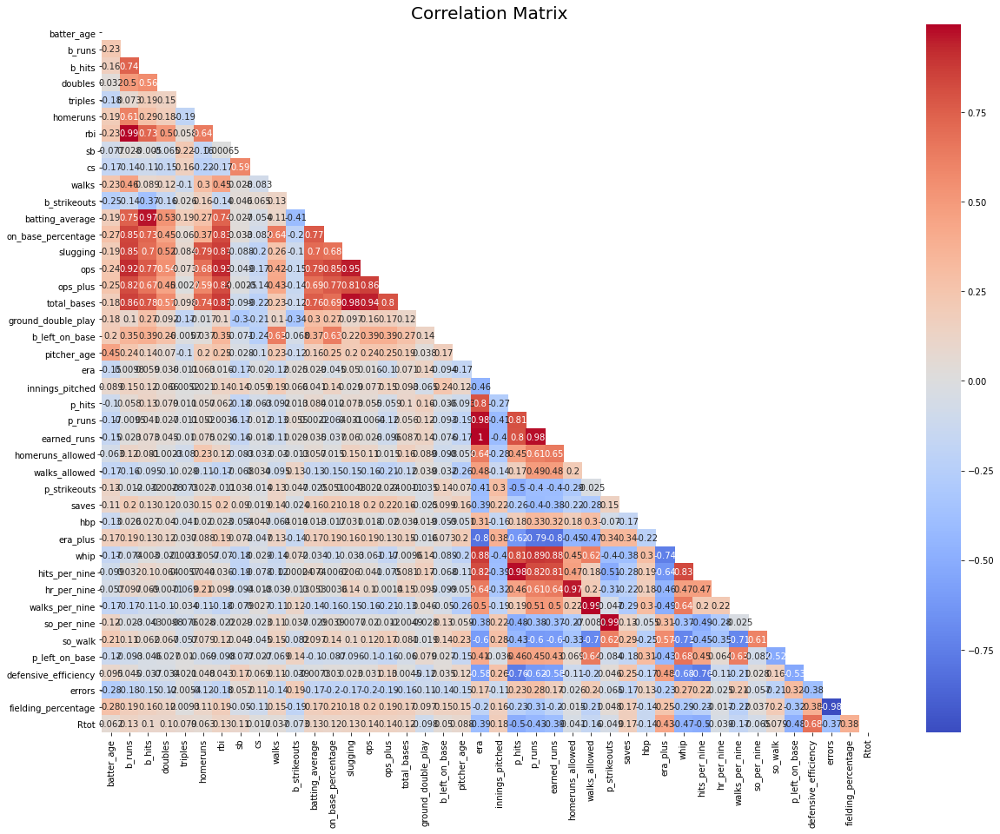

In [54]:
# Plotting correlation matrix
plt.figure(figsize=(20,15))
matrix = np.triu(X.corr())
sns.heatmap(X.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.title('Correlation Matrix', fontsize = 20)
plt.show()

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;As shown here, correlations in dark red and dark blue indicate that two features are very highly correlated. This is due to the nature of how some features are calculated. 

Ex) `era` = `earned_runs` / `innings_pitched`

`so_per_nine` = `p_strikeouts` / `innings_pitched` and so on

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;I will get rid of features which have greater than 0.8 to ensure I do not violate multicollinearity among the features for logistic regression model.

In [55]:
# Need feature name as well hence making a matrix called 'upper'

corr_matrix = X.corr().abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

In [56]:
# Create a list with corr over 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

In [57]:
# See what is in
to_drop

['rbi',
 'batting_average',
 'on_base_percentage',
 'slugging',
 'ops',
 'ops_plus',
 'total_bases',
 'p_runs',
 'earned_runs',
 'whip',
 'hits_per_nine',
 'hr_per_nine',
 'walks_per_nine',
 'so_per_nine',
 'fielding_percentage']

In [58]:
X2 = X.drop(to_drop, axis=1)

In [59]:
# VIF of features after removal of strong multicollinearity
pd.Series([variance_inflation_factor(X2.values, i) for i in range(X2.shape[1])], index = X2.columns)

batter_age               6.800814
b_runs                  29.389794
b_hits                  26.130220
doubles                  7.425647
triples                  5.317200
homeruns                11.044944
sb                       6.800203
cs                       7.166247
walks                   17.830679
b_strikeouts             7.612434
ground_double_play       6.854596
b_left_on_base          15.373138
pitcher_age              5.713431
era                     45.208967
innings_pitched          7.444141
p_hits                  42.064354
homeruns_allowed        10.776950
walks_allowed           22.638334
p_strikeouts            23.343405
saves                    5.644455
hbp                      5.355790
era_plus                14.030671
so_walk                 24.692198
p_left_on_base          15.707139
defensive_efficiency    18.798983
errors                   5.414283
Rtot                    11.098083
dtype: float64

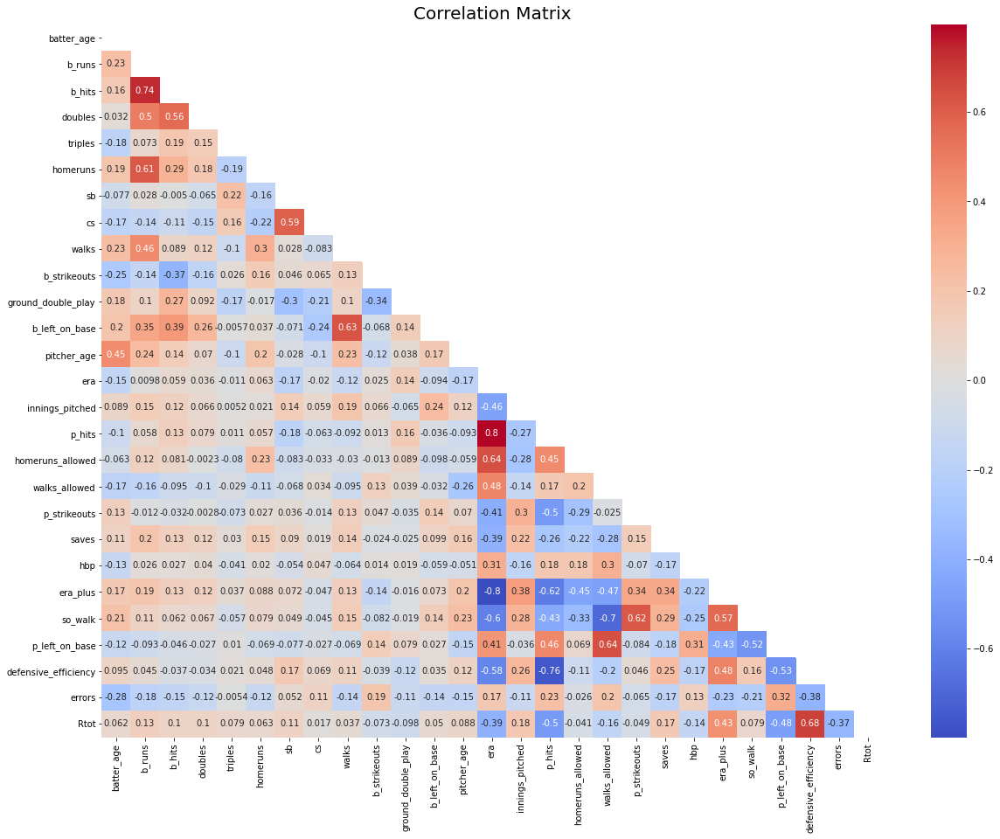

In [60]:
# Plotting correlation matrix after removing highly correlated features
plt.figure(figsize=(20,15))
matrix = np.triu(X2.corr())
sns.heatmap(X2.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.title('Correlation Matrix', fontsize = 20)
plt.show()

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Compare to earlier, VIF are much smaller indicating collinearity is not as great. Notice `era` has strong collinearity still with other features but since `era` is core pitching stat that essentially is tied to many other pitching stats, it is understandable that `era` has highest VIF

In [61]:
# New features for modelling after removing strong multicollinearity among features
X2

,batter_age,b_runs,b_hits,doubles,triples,homeruns,sb,cs,walks,b_strikeouts,...,walks_allowed,p_strikeouts,saves,hbp,era_plus,so_walk,p_left_on_base,defensive_efficiency,errors,Rtot
0,0.941176,0.685934,0.587571,0.468342,0.000000,0.488771,0.214337,0.500000,0.215278,0.000000,...,0.063830,0.282276,0.935277,0.239003,0.465116,0.733333,0.212781,0.633333,0.168675,0.670956
1,0.676471,0.956616,0.740113,0.874904,0.233333,0.799160,0.383257,0.442308,0.732639,0.294979,...,0.276596,0.291028,0.710810,0.106224,1.000000,0.504762,0.030994,1.000000,0.000000,1.000000
2,0.088235,0.845882,0.502825,0.874904,0.500000,1.000000,0.082139,0.480769,0.815972,0.539749,...,0.939716,0.374179,0.897866,0.796676,0.348837,0.095238,0.977980,0.283333,0.674699,0.403608
3,0.088235,0.174592,0.029687,0.000000,0.227403,0.000000,0.175182,0.322322,0.311925,0.540378,...,0.332724,0.252890,0.814092,0.868035,0.348837,0.419048,0.000000,0.550000,0.411634,0.541635
4,1.000000,0.761549,0.532235,0.663085,0.591820,0.489947,0.000000,0.188532,0.460314,0.538299,...,0.184702,0.539958,0.367914,0.287390,0.883721,0.828571,0.407563,0.283333,0.411634,0.357684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373,0.454545,0.587071,0.414226,0.187061,0.000000,0.551391,0.280000,0.366667,0.465999,0.471605,...,0.762846,0.381625,0.468750,0.500000,0.377358,0.164103,1.000000,0.255814,1.000000,0.304742
1374,0.181818,0.435311,0.606695,0.384597,0.829268,0.153431,0.930000,1.000000,0.533863,0.491358,...,0.399209,0.530035,0.750000,0.181818,0.547170,0.466667,0.000000,0.790698,0.314286,0.787870
1375,0.272727,0.509426,0.158996,0.323817,0.365854,0.471799,0.390000,0.466667,0.601726,0.728395,...,0.359684,0.000000,0.437500,0.613636,0.301887,0.179487,0.417840,0.186047,0.814286,0.587187
1376,0.727273,0.410605,0.276151,0.734085,0.170732,0.638219,0.120000,0.300000,0.348368,0.488889,...,0.596838,0.312721,0.343750,0.500000,0.132075,0.220513,0.615023,0.093023,0.542857,0.000000


In [62]:
# Double check to see if I have right number of features
(X.shape[1] - len(to_drop)) == X2.shape[1]

True

In [63]:
# Making update on df_scaled with upated number of features
df_scaled = df_scaled.drop(to_drop, axis=1)

In [64]:
# Save into csv file so I can work with it on my modelling page
#df_scaled.to_csv(r'C:\Users\DK\Desktop\data science\Capstone\data\scaled.csv', index = False)